# 量子ビットを理解する

In [1]:
import numpy as np
import math
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

## 設定

In [86]:
#|0>と|1>の混合比率設定（0.0~1.0）
brend = 0.8

#|0>から見た|1>の位相のずれ設定（0.0~2.0）
shift_pi=0.3

## 以降はポチポチするだけ

In [87]:
shift=shift_pi*math.pi

w_0 = math.sqrt(brend)
w_1 = math.sqrt(1-brend)

range = math.pi*(brend-1)

print(round(w_0**2+w_1**2,2),'must be 1.0')

a_x = math.sin(-range)*math.cos(shift)
a_y = math.sin(-range)*math.sin(shift)
a_z = math.cos(range)

print('x is',round(a_x,2))
print('y is',round(a_y,2))
print('z is',round(a_z,2))

1.0 must be 1.0
x is 0.35
y is 0.48
z is 0.81


In [25]:
# ラジアンを作成
t = np.linspace(start=0.0, stop=2.0*np.pi, num=25)
u = np.linspace(start=0.0, stop=2.0*np.pi, num=25)

# 格子点を作成
T, U = np.meshgrid(t, u)

# 球面の座標を計算
X = np.sin(T) * np.sin(U)
Y = np.sin(T) * np.cos(U)
Z = np.cos(T)

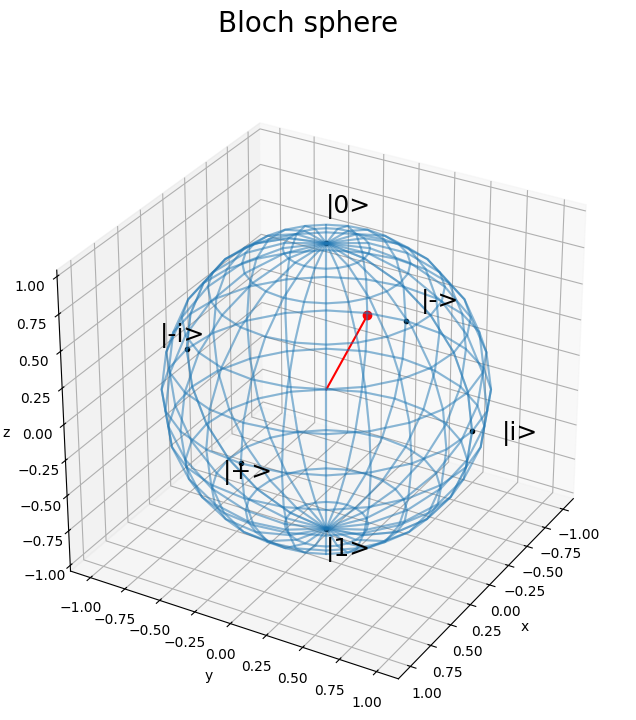

In [88]:
# 球面を作図
fig, ax = plt.subplots(figsize=(8, 8), facecolor='white', 
                       subplot_kw={'projection': '3d'})
ax.plot_wireframe(X, Y, Z, alpha=0.3)

fig.suptitle('Bloch sphere', fontsize=20)
ax.set_aspect('equal')
ax.view_init(elev=30, azim=30)# 視点を設定

# アローを描画
plt.plot([0,a_x],[0, a_y], [0,a_z], color="red")
plt.plot(a_x,a_y,a_z,marker='o', color="red")

ax.set_xlabel('x') 
ax.set_ylabel('y')
ax.set_zlabel('z')


ax.text(0,0,1.2,'|0>',color='black',fontsize=18)
ax.text(0,0,-1.2,'|1>',color='black',fontsize=18)

ax.text(-1.2,0,0,'|->',color='black',fontsize=18)
ax.text(1.2,0,0,'|+>',color='black',fontsize=18)

ax.text(0,1.2,0,'|i>',color='black',fontsize=18)
ax.text(0,-1.2,0,'|-i>',color='black',fontsize=18)

plt.plot(0,0,1,marker='.',color='black')
plt.plot(0,0,-1,marker='.',color='black')

plt.plot(-1,0,0,marker='.',color='black')
plt.plot(1,0,0,marker='.',color='black')

plt.plot(0,1,0,marker='.',color='black')
plt.plot(0,-1,0,marker='.',color='black')

plt.show()

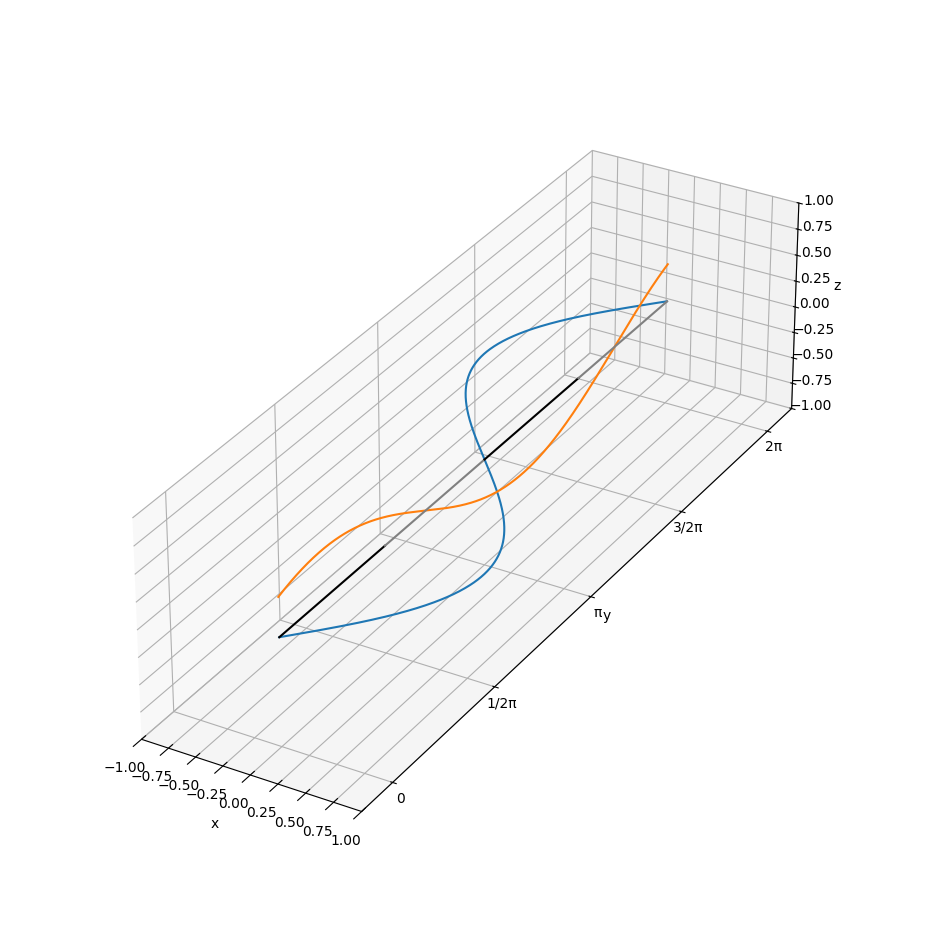

In [89]:
fig = plt.figure(figsize=(16,12)) #図のサイズを決定
ax = fig.add_subplot(projection='3d') #3d空間の作成

yo = np.arange(0,2*math.pi,0.01)

#各軸に対するラベルの作成
ax.set_xlabel('x') 
ax.set_ylabel('y')
ax.set_zlabel('z')

zo = np.zeros(yo.shape[0])
x = np.sin(yo)*w_0
ax.plot(x,yo,zo)

xo = np.zeros(yo.shape[0])
z = np.sin(yo+shift)*w_1
ax.plot(xo,yo,z)

y1 = np.arange(0,1/2*math.pi,0.01)
x1 = np.zeros(y1.shape[0])
z1 = np.zeros(y1.shape[0])
ax.plot(x1,y1,z1,color='k')
y2 = np.arange(1/2*math.pi,math.pi,0.01)
x2 = np.zeros(y2.shape[0])
z2 = np.zeros(y2.shape[0])
ax.plot(x2,y2,z2,color='gray')
y3 = np.arange(math.pi,3/2*math.pi,0.01)
x3 = np.zeros(y3.shape[0])
z3 = np.zeros(y3.shape[0])
ax.plot(x3,y3,z3,color='k')
y4 = np.arange(3/2*math.pi,2*math.pi,0.01)
x4 = np.zeros(y4.shape[0])
z4 = np.zeros(y4.shape[0])
ax.plot(x4,y4,z4,color='gray')


ax.set_xlim(-1,1)
ax.set_zlim(-1,1)
plt.yticks([0, 1.57,3.14, 4.71,6.28], ["0", "1/2π", "π","3/2π","2π"])
ax.set_aspect('equal')
plt.show()

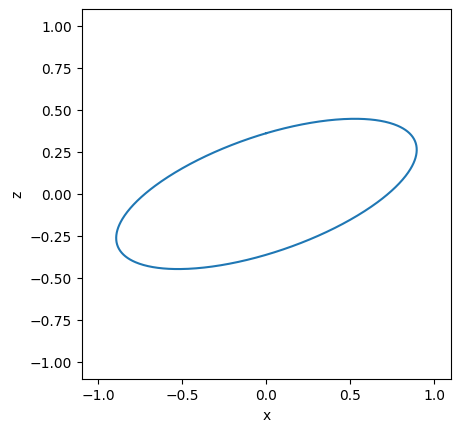

In [90]:
fig, ax = plt.subplots()
xdata, ydata = [], []
ln, = plt.plot([], [])

def init():
    ax.set_xlim(-1.1, 1.1)
    ax.set_ylim(-1.1, 1.1)
    ax.set_xlabel('x') 
    ax.set_ylabel('z')
    ax.set_aspect('equal')
    return ln,

def update(frame):
    xdata.append(x[int(frame)])
    ydata.append(z[int(frame)])
    ln.set_data(xdata, ydata)
    return ln,

ani = FuncAnimation(fig, update, frames=np.linspace(0, 628, 628),init_func=init, blit=True, interval=20)

HTML(ani.to_jshtml())